In [1]:
import tensorflow as tf
print(tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

2.6.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
from PIL import Image
import numpy as np
from skimage import transform
from keras.preprocessing.image import img_to_array
from tensorflow.image import resize
import tensorflow as tf
import shutil
import os


imsize = (96,128)

In [3]:
x1_train = []
for archivo in os.listdir('dataset_sunrgbd/train_rgb'):
    img = Image.open(os.path.join('dataset_sunrgbd/train_rgb',archivo))
    img = resize(img_to_array(img), imsize)
    x1_train.append(np.asarray(img))
for archivo in os.listdir('dataset_sunrgbd/test_rgb'):
    img = Image.open(os.path.join('dataset_sunrgbd/test_rgb',archivo))
    img = resize(img_to_array(img), imsize)
    x1_train.append(np.asarray(img))
x1_train = np.array(x1_train)
x1_train = x1_train/255.0
print(x1_train.shape)

x2_train = []
for archivo in os.listdir('dataset_sunrgbd/train_rgb'):
    img = Image.open(os.path.join('dataset_sunrgbd/train_rgb',archivo))
    img = resize(img_to_array(img), imsize)
    x2_train.append(np.asarray(img))
for archivo in os.listdir('dataset_sunrgbd/test_rgb'):
    img = Image.open(os.path.join('dataset_sunrgbd/test_rgb',archivo))
    img = resize(img_to_array(img), imsize)
    x2_train.append(np.asarray(img))
x2_train = np.array(x2_train)
x2_train = x2_train/255.0
print(x2_train.shape)

y_train = []
for archivo in os.listdir('dataset_sunrgbd/train_label'):
    img = np.load(os.path.join('dataset_sunrgbd/train_label',archivo))
    img[img == 20] = 2
    img[img == 3] = 0
    img[img == 31] = 3
    img[img > 3] = 0
    img = resize(img_to_array(img), imsize)
    y_train.append(img)
    
for archivo in os.listdir('dataset_sunrgbd/test_label'):
    img = np.load(os.path.join('dataset_sunrgbd/test_label',archivo))
    img[img == 20] = 2
    img[img == 3] = 0
    img[img == 31] = 3
    img[img > 3] = 0
    img = resize(img_to_array(img), imsize)
    y_train.append(img)
y_train = np.array(y_train).astype('uint8')
y_train = tf.keras.utils.to_categorical(y_train, dtype='float32')
print(y_train.shape)

del img

(10335, 96, 128, 3)
(10335, 96, 128, 3)
(10335, 96, 128, 4)


In [4]:
x1_val = x1_train[7735:9335]
x1_test = x1_train[9335:10335]
x2_val = x2_train[7735:9335]
x2_test = x2_train[9335:10335]

y_val = y_train[7735:9335]
y_test = y_train[9335:10335]

x1_train = x1_train[:7735]
x2_train = x2_train[:7735]
y_train = y_train[:7735]

In [5]:
print(x1_train.shape, x2_train.shape, y_train.shape)
print(x1_val.shape, x2_val.shape, y_val.shape)
print(x1_test.shape, x2_test.shape, y_test.shape)

(7735, 96, 128, 3) (7735, 96, 128, 3) (7735, 96, 128, 4)
(1600, 96, 128, 3) (1600, 96, 128, 3) (1600, 96, 128, 4)
(1000, 96, 128, 3) (1000, 96, 128, 3) (1000, 96, 128, 4)


In [6]:
import matplotlib.pyplot as plt

def plot_color(ax, color, title="Color"):
    """Displays a color image from the NYU dataset."""

    ax.axis('off')
    ax.set_title(title)
    ax.imshow(color)

def plot_depth(ax, depth, title="Depth"):
    """Displays a depth map from the NYU dataset."""

    ax.axis('off')
    ax.set_title(title)
    ax.imshow(depth, cmap='Spectral')

def plot_label(ax, labels, title="Label"):
    """Displays a label map from the NYU dataset."""

    ax.axis('off')
    ax.set_title(title)
    ax.imshow(labels)

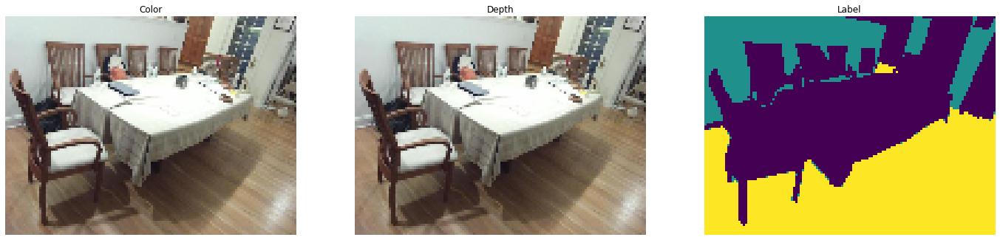

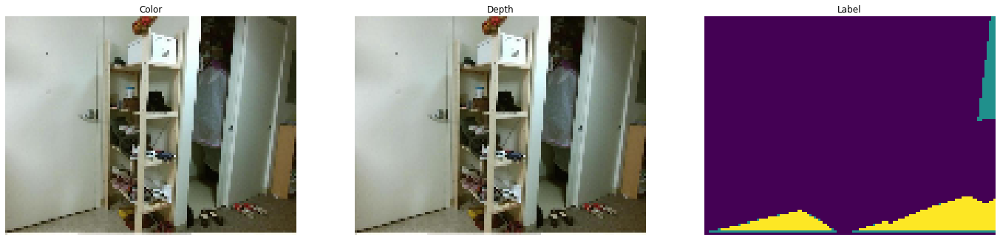

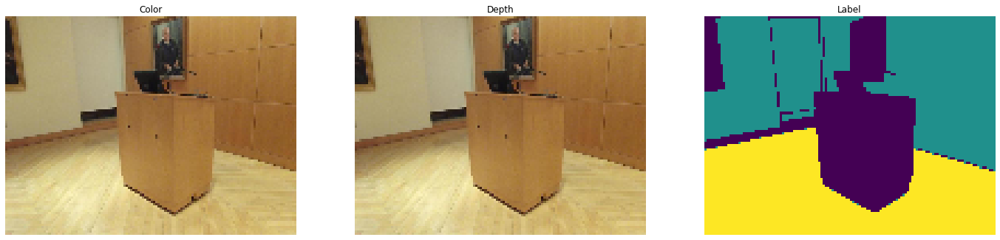

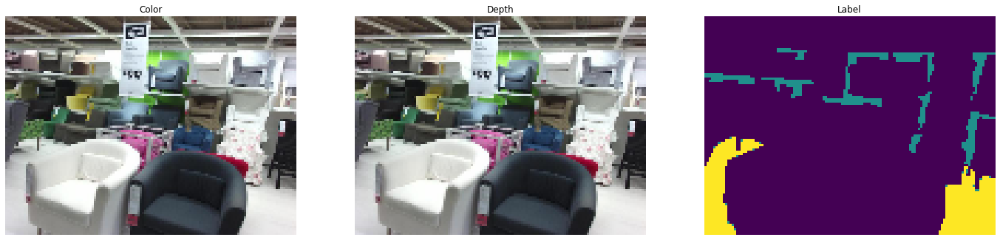

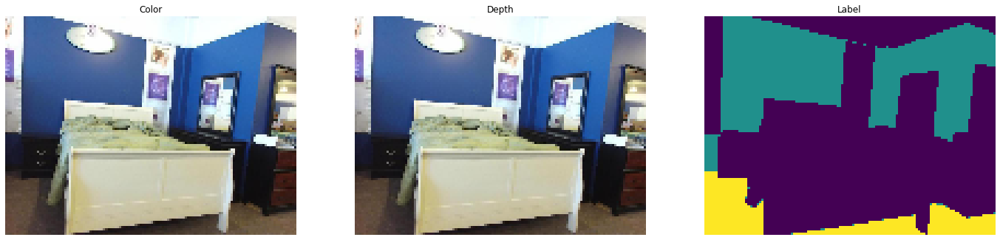

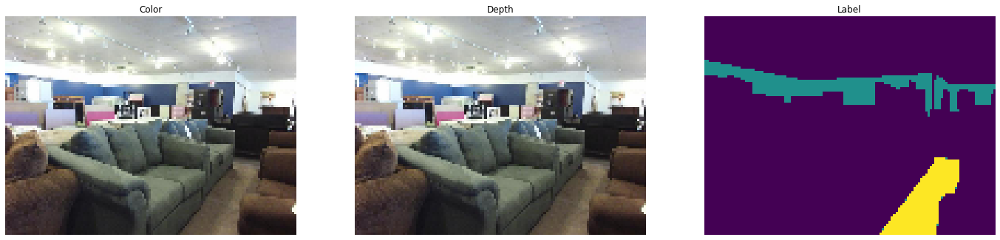

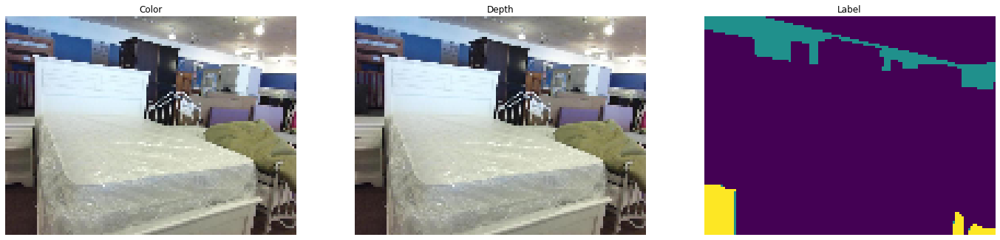

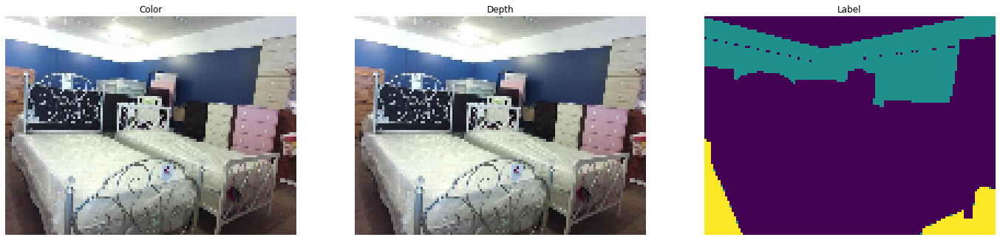

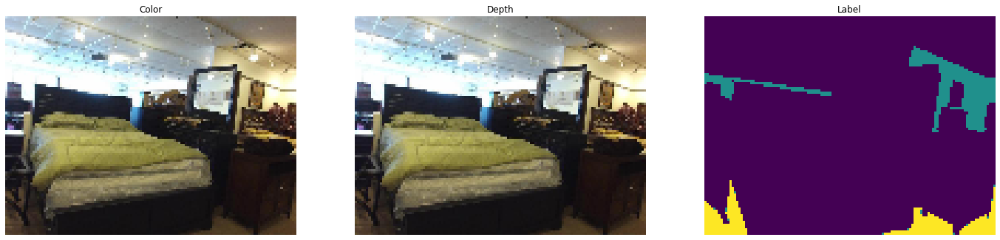

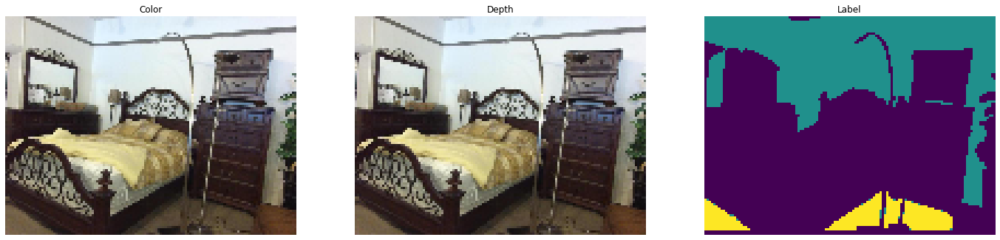

In [7]:
for number in range(10):
    fig = plt.figure("Labeled Dataset Sample", figsize=(24, 10))
    ax = fig.add_subplot(1, 3, 1)
    plot_color(ax, x1_train[number])
    
    ax = fig.add_subplot(1, 3, 2)
    plot_depth(ax, x2_train[number])

    ax = fig.add_subplot(1, 3, 3)
    plot_label(ax, np.argmax(y_train[number],axis=-1))

    plt.show()


In [8]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
        rotation_range=15,
        zoom_range=[0.9, 1.25],
        width_shift_range=0.1,
        height_shift_range=0.1,
        fill_mode="nearest")
val_datagen = ImageDataGenerator()

In [9]:
train_datagen.fit(x1_train)
val_datagen.fit(x1_val)

In [10]:
train = train_datagen.flow([x1_train,x2_train], y_train, batch_size=16)
validation = val_datagen.flow([x1_val,x2_val], y_val, batch_size=16)

In [11]:
class MyModel():

    def __init__(self):
        '''
        Crear el modelos para segmentación
        '''
        self.input_rgb = tf.keras.layers.Input(shape=(96,128,3),dtype=tf.float32)
        self.input_depth = tf.keras.layers.Input(shape=(96,128,3),dtype=tf.float32)
        self.fusion_1 = None
        self.fusion_2 = None
        self.fusion_3 = None

    def rgbd_fusion(self,input_r,input_d,capa):
        r = tf.keras.layers.GlobalAveragePooling2D()(input_r)
        r = tf.keras.layers.Reshape((1,1,64*capa))(r)
        r = tf.keras.layers.Conv2D(4*capa,kernel_size=(1,1),strides=(1,1),activation='relu')(r)
        r = tf.keras.layers.Conv2D(64*capa,kernel_size=(1,1),strides=(1,1),activation='sigmoid')(r)
        m_1 = tf.keras.layers.Multiply()([input_r,r])
        
        d = tf.keras.layers.GlobalAveragePooling2D()(input_d)
        d = tf.keras.layers.Reshape((1,1,64*capa))(d)
        d = tf.keras.layers.Conv2D(4*capa,kernel_size=(1,1),strides=(1,1),activation='relu')(d)
        d = tf.keras.layers.Conv2D(64*capa,kernel_size=(1,1),strides=(1,1),activation='sigmoid')(d)
        m_2 = tf.keras.layers.Multiply()([input_d,d])
        
        return tf.keras.layers.Add()([m_1,m_2])

    def resnet_layer(self,input_res, input_add, filters):
        x = tf.keras.layers.Conv2D(filters, (3, 1), padding='same')(input_res)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)

        x = tf.keras.layers.Conv2D(filters, (1, 3), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)

        x = tf.keras.layers.Conv2D(filters, (3, 1), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)

        x = tf.keras.layers.Conv2D(filters, (1, 3), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        x = tf.keras.layers.Add()([input_add,x])
        x = tf.keras.layers.Activation('relu')(x)
        
        return x
    
    def resnet_layer_div(self,input_res, input_add, filters):
        x = tf.keras.layers.Conv2D(filters, (3, 1), padding='same', strides=(2,1))(input_res)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        
        x = tf.keras.layers.Conv2D(filters, (1, 3), padding='same', strides=(1,2))(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)

        x = tf.keras.layers.Conv2D(filters, (3, 1), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)

        x = tf.keras.layers.Conv2D(filters, (1, 3), padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation('relu')(x)
        x = tf.keras.layers.Add()([input_add,x])
        x = tf.keras.layers.Activation('relu')(x)

        return x
    
    def bottleneck_layer(self,input_bo,filters):
        x = tf.keras.layers.Conv2D(filters, kernel_size=(3, 1), activation='relu', padding='same')(input_bo)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Conv2D(filters, kernel_size=(1, 3), activation='relu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Conv2D(filters, kernel_size=(3, 1), activation='relu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Conv2D(filters, kernel_size=(1, 3), activation='relu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Add()([x, input_bo])
        x = tf.keras.layers.Activation('relu')(x)
        return x

    def decode_layer(self,input_de,input_add,filters):
        x = tf.keras.layers.Conv2D(filters,kernel_size=(3,3),activation='relu', padding='same')(input_de)
        x = self.bottleneck_layer(x, filters)
        x = self.bottleneck_layer(x, filters)
        x = self.bottleneck_layer(x, filters)
        x = tf.keras.layers.UpSampling2D(size=(2,2), interpolation="nearest")(x)
        x_2 = tf.keras.layers.Conv2D(filters, kernel_size=(1, 1), activation='relu', padding='same')(input_add)
        x = tf.keras.layers.Add()([x, x_2])

        return x
        
    def model(self):

        # Preparar la entrada de datos
        xr = tf.keras.layers.Conv2D(64,kernel_size=(7,7),strides=(2,2),padding='same',dilation_rate=(1,1),activation='relu')(self.input_rgb)
        xd = tf.keras.layers.Conv2D(64,kernel_size=(7,7),strides=(2,2),padding='same',dilation_rate=(1,1),activation='relu')(self.input_depth)

        # Fusion
        xd = self.rgbd_fusion(xr,xd,1)

        # Preparar para encoder
        xr = tf.keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding='same')(xr)
        xd = tf.keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding='same')(xd)

        ''' ENCODER'''
        # PRIMERA CAPA
        n = 3 # las veces que se repite el resnet_layer
        for k in range(n):
            xr = self.resnet_layer(xr,xr,64)
            xd = self.resnet_layer(xd,xd,64)
            
        # Fusion dentro de Resnet
        xd = self.rgbd_fusion(xr,xd,1)
        self.fusion_1 = xd  # Aqui guardamos la fusion realizada despues de la capa resnet. Esto lo utilizaremos para decodificar.

        # SEGUNDA CAPA
        xr = self.resnet_layer_div(xr,tf.keras.layers.Conv2D(128,kernel_size=(1,1),strides=(2,2))(xr),128)
        xd = self.resnet_layer_div(xd,tf.keras.layers.Conv2D(128,kernel_size=(1,1),strides=(2,2))(xd),128)

        n = 3 # las veces que se repite el resnet_layer
        for k in range(n):
            xr = self.resnet_layer(xr,xr,128)
            xd = self.resnet_layer(xd,xd,128)
            
        # Fusion dentro de Resnet
        xd = self.rgbd_fusion(xr,xd,2)
        self.fusion_2 = xd  # Aqui guardamos la fusion realizada despues de la capa resnet. Esto lo utilizaremos para decodificar.

        # TERCERA CAPA
        xr = self.resnet_layer_div(xr,tf.keras.layers.Conv2D(256,kernel_size=(1,1),strides=(2,2))(xr),256)
        xd = self.resnet_layer_div(xd,tf.keras.layers.Conv2D(256,kernel_size=(1,1),strides=(2,2))(xd),256)

        n = 3 # las veces que se repite el resnet_layer
        for k in range(n):
            xr = self.resnet_layer(xr,xr,256)
            xd = self.resnet_layer(xd,xd,256)
            
        # Fusion dentro de Resnet
        xd = self.rgbd_fusion(xr,xd,4)
        self.fusion_3 = xd  # Aqui guardamos la fusion realizada despues de la capa resnet. Esto lo utilizaremos para decodificar.

        # CUARTA CAPA
        xr = self.resnet_layer_div(xr,tf.keras.layers.Conv2D(512,kernel_size=(1,1),strides=(2,2))(xr),512)
        xd = self.resnet_layer_div(xd,tf.keras.layers.Conv2D(512,kernel_size=(1,1),strides=(2,2))(xd),512)

        n = 3 # las veces que se repite el resnet_layer
        for k in range(n):
            xr = self.resnet_layer(xr,xr,512)
            xd = self.resnet_layer(xd,xd,512)
            
        # Fusion dentro de Resnet
        xr = self.rgbd_fusion(xr,xd,8)

        '''DECODER'''

        xr = self.decode_layer(xr,self.fusion_3,512)
        xr = self.decode_layer(xr,self.fusion_2,256)
        xr = self.decode_layer(xr,self.fusion_1,128)
        
        xr = tf.keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(xr)
        xr = tf.keras.layers.UpSampling2D(size=(2,2), interpolation="nearest")(xr)
        xr = tf.keras.layers.Conv2D(32, kernel_size=(1, 1), activation='relu', padding='same')(xr)
        xr = tf.keras.layers.UpSampling2D(size=(2,2), interpolation="nearest")(xr)
        xr = tf.keras.layers.Conv2D(4, kernel_size=(1, 1), activation='softmax', padding='same')(xr)

        return tf.keras.Model(inputs=[self.input_rgb, self.input_depth], outputs=xr)

In [12]:
model = MyModel().model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 96, 128, 3)] 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 96, 128, 3)] 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 48, 64, 64)   9472        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 48, 64, 64)   9472        input_2[0][0]                    
______________________________________________________________________________________________

In [13]:
import matplotlib.pyplot as plt

def plot_acc(history, title="Model Accuracy"):
    """Imprime una gráfica mostrando la accuracy por epoch obtenida en un entrenamiento"""
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(title)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()
    
def plot_loss(history, title="Model Loss"):
    """Imprime una gráfica mostrando la pérdida por epoch obtenida en un entrenamiento"""
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(title)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper right')
    plt.show()
    
def plot_compare_losses(history1, history2, name1="Red 1",
                        name2="Red 2", title="Graph title"):
    """Compara losses de dos entrenamientos con nombres name1 y name2"""
    plt.plot(history1.history['loss'], color="green")
    plt.plot(history1.history['val_loss'], 'r--', color="green")
    plt.plot(history2.history['loss'], color="blue")
    plt.plot(history2.history['val_loss'], 'r--', color="blue")
    plt.title(title)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train ' + name1, 'Val ' + name1, 
                'Train ' + name2, 'Val ' + name2],
               loc='upper right')
    plt.show()
    
def plot_compare_accs(history1, history2, name1="Red 1",
                      name2="Red 2", title="Graph title"):
    """Compara accuracies de dos entrenamientos con nombres name1 y name2"""
    plt.plot(history1.history['accuracy'], color="green")
    plt.plot(history1.history['val_accuracy'], 'r--', color="green")
    plt.plot(history2.history['accuracy'], color="blue")
    plt.plot(history2.history['val_accuracy'], 'r--', color="blue")
    plt.title(title)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train ' + name1, 'Val ' + name1, 
                'Train ' + name2, 'Val ' + name2], 
               loc='lower right')
    plt.show()

In [14]:
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import backend as K

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred = K.cast(y_pred, 'float32')
    y_pred_f = K.cast(K.greater(K.flatten(y_pred), 0.5), 'float32')
    intersection = y_true_f * y_pred_f
    score = 2. * K.sum(intersection) / (K.sum(y_true_f) + K.sum(y_pred_f))
    return score

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

def bce_logdice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) - K.log(1. - dice_loss(y_true, y_pred))

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) + 
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd
    averaged_mask = K.pool2d(
            y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = weighted_bce_loss(y_true, y_pred, weight) + dice_loss(y_true, y_pred)
    return loss

def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)
#seg_model.compile(optimizer=Adam(1e-4, decay=1e-6), loss=dice_p_bce, metrics=[dice_coef, 'binary_accuracy', true_positive_rate])

In [15]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
import math
weight_path="{}_best_weights.hdf5".format('seg_model_2')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.5, 
                                   patience=3, 
                                   verbose=1, min_delta=0.0001, cooldown=2, min_lr=1e-7)

def step_decay(epoch, lr):
    decay_rate = 0.75
    decay_step = 2
    if epoch % decay_step == 0 and epoch:
        return lr * decay_rate
    return lr

lrate = LearningRateScheduler(step_decay)

early = EarlyStopping(monitor="val_loss",
                      patience=5) # probably needs to be more patient, but kaggle time is limited

callbacks_list = [checkpoint, early, lrate]

In [16]:
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import precision, iou_score, FScore

opt = tf.keras.optimizers.Adam(learning_rate=0.00001, amsgrad=True, name="Adam")

model.compile(optimizer="Adam", loss=bce_jaccard_loss, 
              metrics=[dice_coef, 
                       'accuracy', 
                       true_positive_rate, 
                       iou_score
                      ])

history = model.fit(train, epochs=1000, verbose=1, steps_per_epoch=256, validation_data=validation, callbacks=callbacks_list)

Segmentation Models: using `keras` framework.
Epoch 1/1000
256/256 [==============================] - 133s 450ms/step - loss: 1.1571 - dice_coef: 0.6343 - accuracy: 0.6363 - true_positive_rate: 0.6293 - iou_score: 0.2692 - val_loss: 1.3126 - val_dice_coef: 0.3725 - val_accuracy: 0.3957 - val_true_positive_rate: 0.3559 - val_iou_score: 0.1997

Epoch 00001: val_loss improved from inf to 1.31255, saving model to seg_model_2_best_weights.hdf5
Epoch 2/1000
256/256 [==============================] - 111s 436ms/step - loss: 0.9937 - dice_coef: 0.7003 - accuracy: 0.7011 - true_positive_rate: 0.6968 - iou_score: 0.3326 - val_loss: 1.0200 - val_dice_coef: 0.7060 - val_accuracy: 0.7065 - val_true_positive_rate: 0.7036 - val_iou_score: 0.3085

Epoch 00002: val_loss improved from 1.31255 to 1.02002, saving model to seg_model_2_best_weights.hdf5
Epoch 3/1000
256/256 [==============================] - 111s 435ms/step - loss: 0.9550 - dice_coef: 0.7208 - accuracy: 0.7214 - true_positive_rate: 0.7181 -

256/256 [==============================] - 112s 436ms/step - loss: 0.7581 - dice_coef: 0.8174 - accuracy: 0.8175 - true_positive_rate: 0.8166 - iou_score: 0.4681 - val_loss: 0.8364 - val_dice_coef: 0.7865 - val_accuracy: 0.7866 - val_true_positive_rate: 0.7857 - val_iou_score: 0.4246

Epoch 00023: val_loss did not improve from 0.82514
Epoch 24/1000
256/256 [==============================] - 111s 435ms/step - loss: 0.7569 - dice_coef: 0.8174 - accuracy: 0.8175 - true_positive_rate: 0.8166 - iou_score: 0.4695 - val_loss: 0.8463 - val_dice_coef: 0.7818 - val_accuracy: 0.7818 - val_true_positive_rate: 0.7809 - val_iou_score: 0.4225

Epoch 00024: val_loss did not improve from 0.82514
Epoch 25/1000
256/256 [==============================] - 112s 438ms/step - loss: 0.7518 - dice_coef: 0.8200 - accuracy: 0.8201 - true_positive_rate: 0.8192 - iou_score: 0.4719 - val_loss: 0.8294 - val_dice_coef: 0.7907 - val_accuracy: 0.7907 - val_true_positive_rate: 0.7901 - val_iou_score: 0.4327

Epoch 00025:

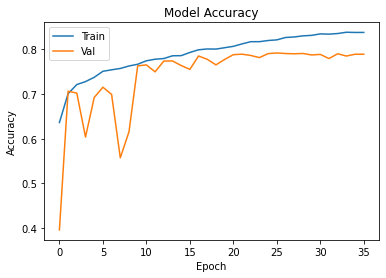

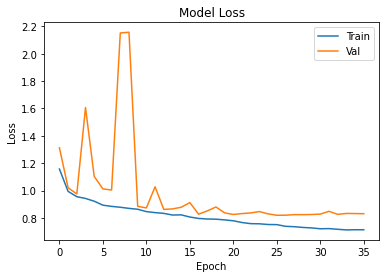

In [17]:
plot_acc(history)
plot_loss(history)

In [57]:
score = model.evaluate([x1_test[:len(x1_test)],x2_test[:len(x1_test)]], y_test[:len(x1_test)], verbose = 0) 

print('Test loss:', score[0]) 
print('Test accuracy:', score[1])

Test loss: 2.4852657318115234
Test accuracy: 0.7727123498916626


In [19]:
model.load_weights('models_weights/seg_model_2_best_weights_2model_3c.hdf5')

In [20]:
# # Para pasar la segmentacion a imagen
y_pred = model.predict([x1_test[:len(x1_test)//5],x2_test[:len(x1_test)//5]])
y_classes = [np.argmax(y_pred[:len(x1_test)//5], axis=-1) for y in y_pred]
print(len(y_classes))

200


In [58]:

print(iou_score(y_test[:len(x1_test)//5],y_pred))
print(true_positive_rate(y_test[:len(x1_test)//5],y_pred))
print(precision(y_test[:len(x1_test)//5],y_pred))
print(FScore(y_test[:len(x1_test)//5],y_pred))

tf.Tensor(0.34801486, shape=(), dtype=float32)
tf.Tensor(0.76918536, shape=(), dtype=float32)
tf.Tensor(0.46338803, shape=(), dtype=float32)


In [43]:
print(y_test[:len(x1_test)//5].shape)
y_true = y_test[:len(x1_test)//5]
print(y_true.shape)
print(y_pred.shape)

(200, 96, 128, 4)
[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1.

In [47]:
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(y_true , y_pred ,labels=['0', '1', '2', '3'])
print(matrix)

ValueError: unknown is not supported

In [21]:
y_classes[1][1]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2]], dtype=int64)

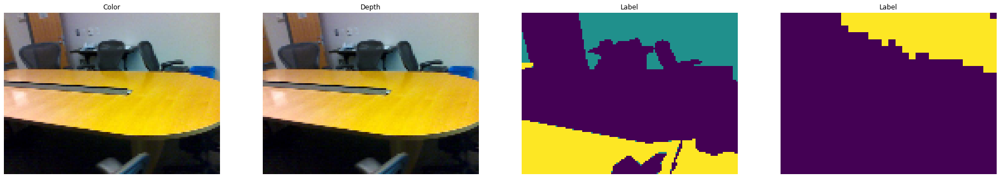

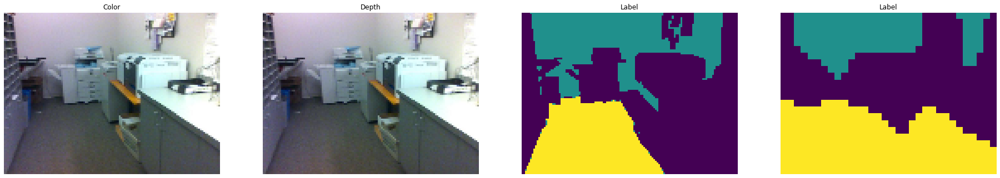

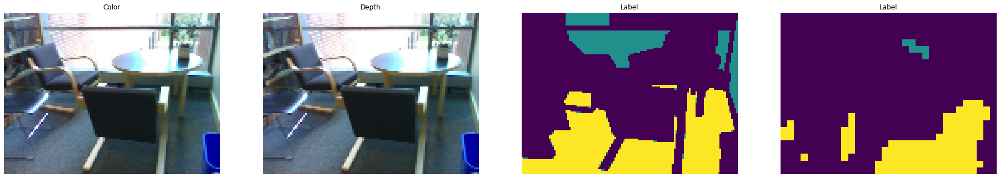

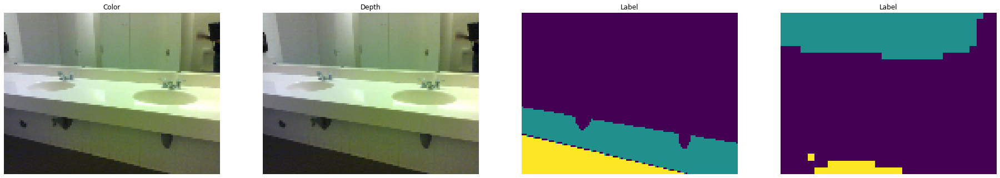

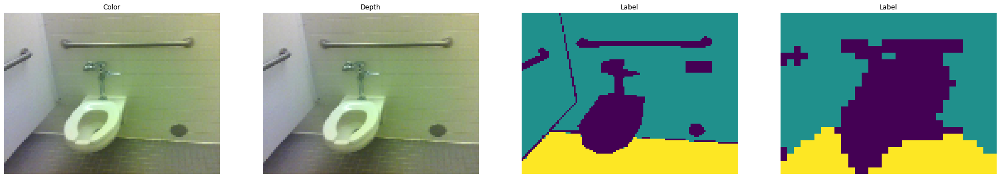

...

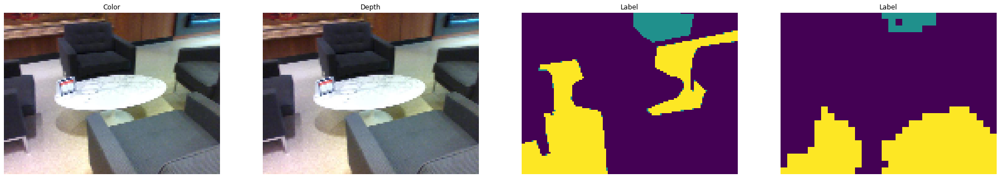

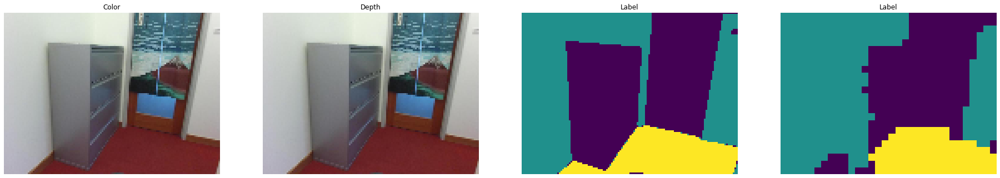

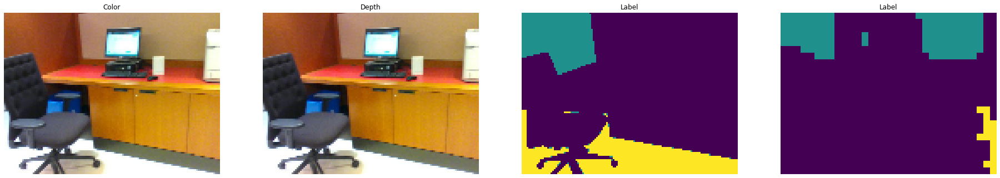

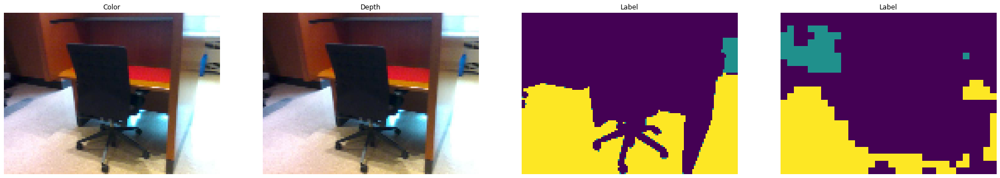

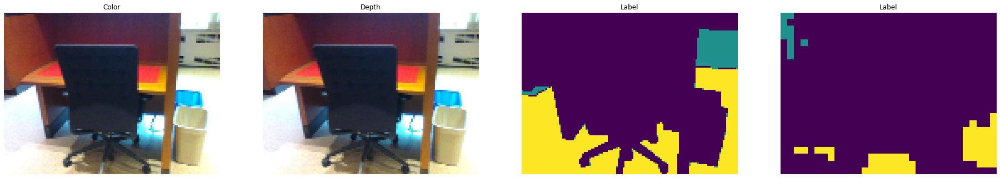

In [22]:
for i in range (len(x1_test)//5):
    fig = plt.figure("Labeled Dataset Sample", figsize=(32, 10))
    ax = fig.add_subplot(1, 4, 1)
    plot_color(ax, x1_test[i])

    ax = fig.add_subplot(1, 4, 2)
    plot_depth(ax, x2_test[i])

    ax = fig.add_subplot(1, 4, 3)
    plot_label(ax, np.argmax(y_test[i],axis=-1))

    ax = fig.add_subplot(1, 4, 4)
    plot_label(ax, y_classes[1][i])

    plt.show()